# Основы компьютерного зрения

## Обработка изображений с помощью библиотеки OpenCV

### Подключение необходимых библиотек

In [ ]:
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np
import cv2

### Чтение изображения из файла и преобразование в многомерный массив

(2397, 3475, 3)


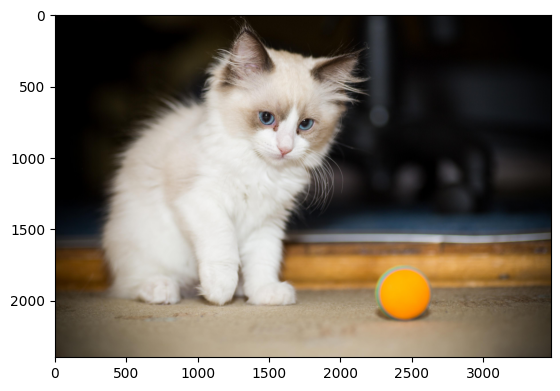

In [ ]:
orig_img = imread('https://imageio.forbes.com/specials-images/imageserve/6082931ef598a85b055afe77/0x0.jpg')
#orig_img = imread('https://cdn.artphotolimited.com/images/5ca5bf82ce46dc3d348294d2/1000x1000/le-royaume-du-jaguar.jpg')

print(orig_img.shape)

plt.imshow(orig_img)

### Изменение размера изображения

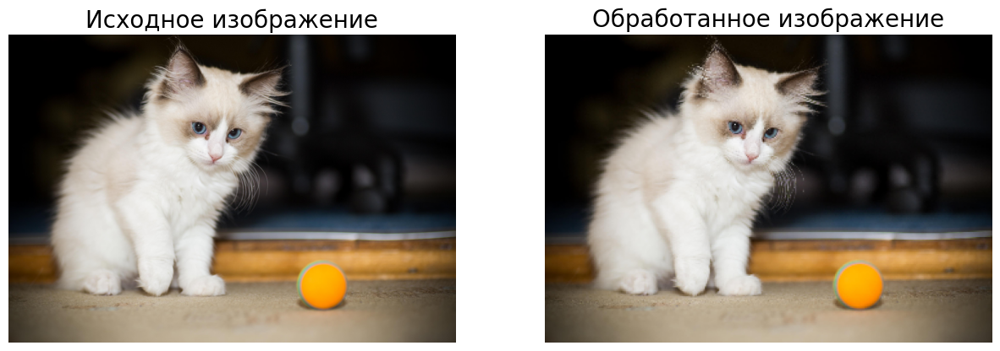

In [ ]:
height = 240
width = 347
resized_img = cv2.resize(orig_img, (width, height)) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(orig_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)

plt.show()

### Кадрирование изображения

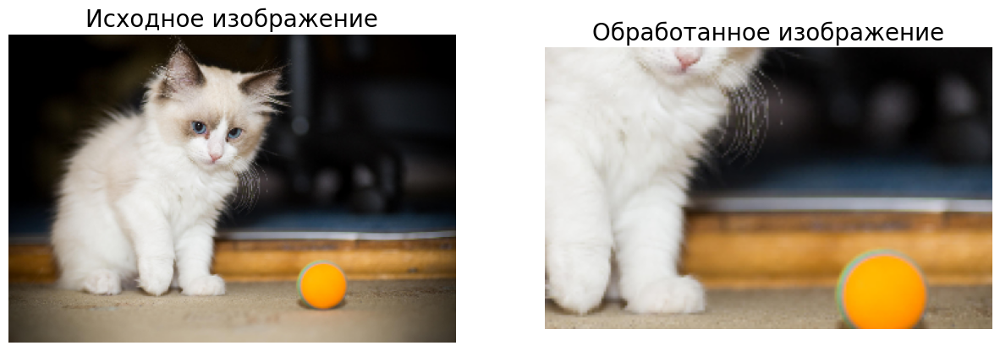

In [ ]:
cropped_img = resized_img[90:210, 100:290] # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(cropped_img )

plt.show()

### Рисование прямоугольников

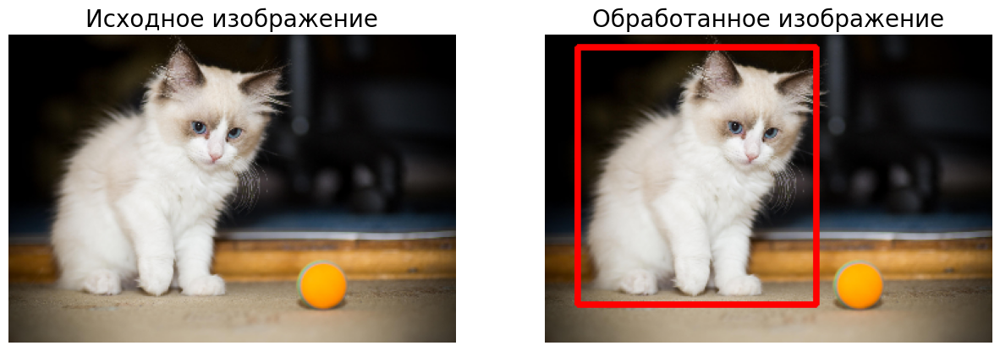

In [ ]:
rect_img = resized_img.copy()
cv2.rectangle(rect_img, (25, 10), (210, 210), (255, 0, 0), 4) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(rect_img)

plt.show()

### Изменение цветового пространства изображения

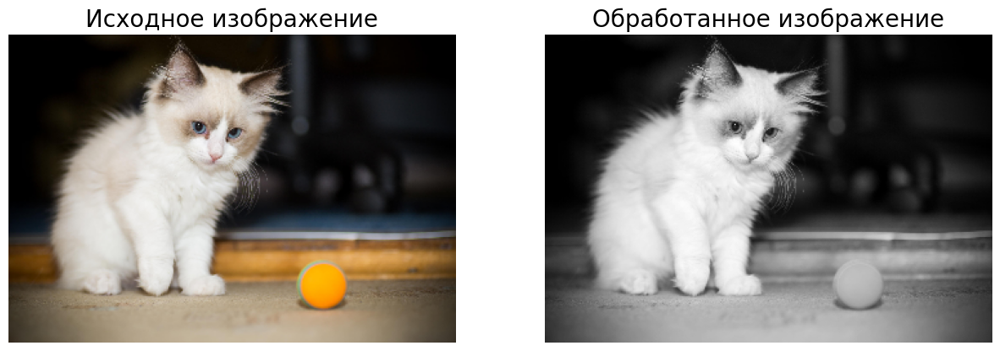

In [ ]:
gray_img = cv2.cvtColor(resized_img, cv2.COLOR_RGB2GRAY) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(gray_img, cmap='gray')

plt.show()

**RGB-пространство** представляет собой куб с длиной ребра 256, в котором любой цвет задается координатами соответствующей точки на этом кубе. Широкое распространение такой модели формирования цвета объясняется тем, что на экране телефона или монитора компьютера изображение формируется за счет точек трех цветов — синего, зеленого и красного.

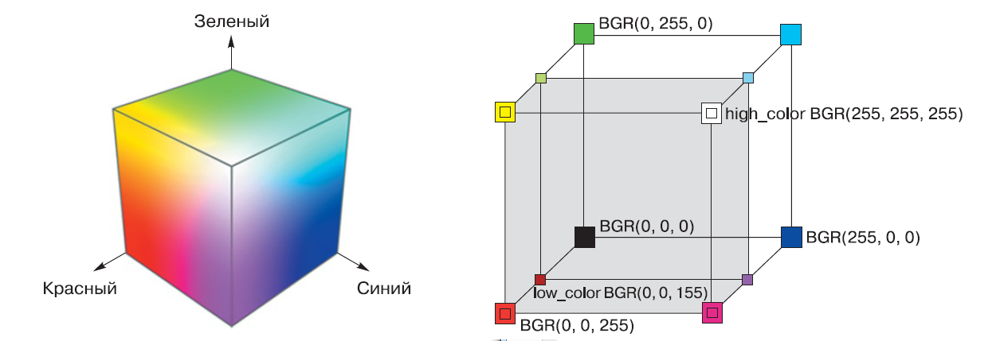

**HSV(B) (Hue, Saturation, Value (Brightness))** — модель цвета, координатами которой являются:

Hue — цветовой тон, который располагается в пределах от 0 до 360 градусов. В операционной системе Windows спектр цвета разделён на 240 оттенков;

Saturation — насыщенность, которая варьируется в пределах от 0 до 100. Чем ближе данный параметр к нулю, тем ближе цвет к серому и наоборот: чем выше цифра, тем цвет «чище»;

Value — яркость. Значение параметра варьируется от 0 до 100.

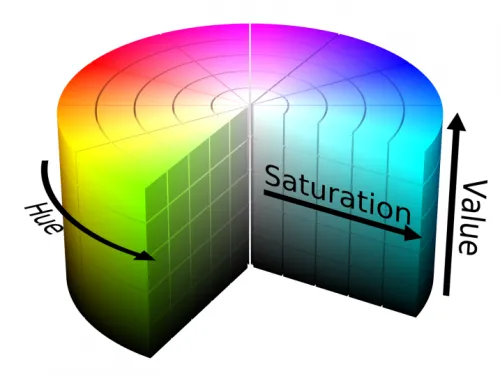

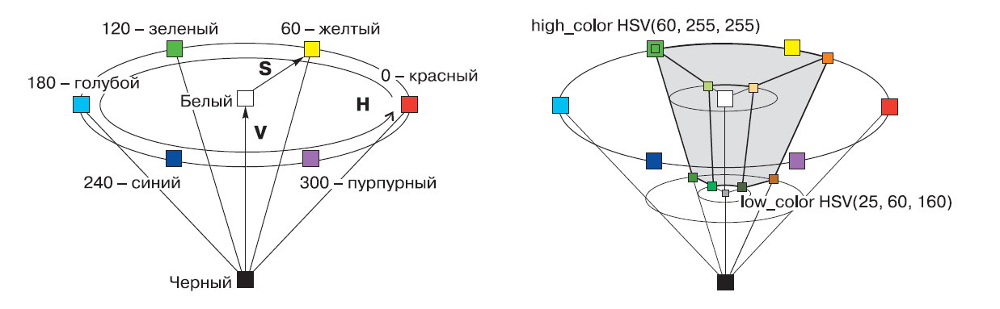

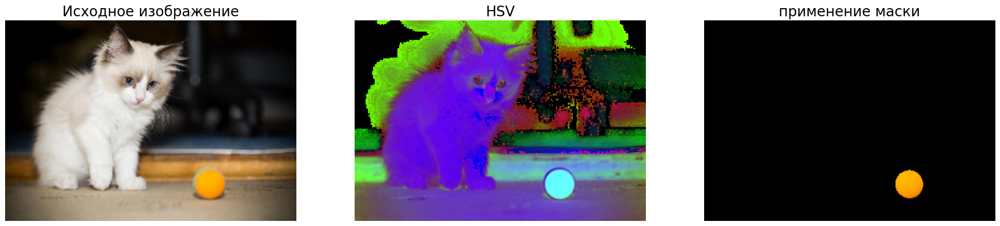

In [ ]:
hsv_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2HSV) # Основная команда


mask = cv2.inRange(hsv_img, (50, 240, 150), (255, 255, 255))
imask = mask>0
orange = np.zeros_like(resized_img, np.uint8)
orange[imask] = resized_img[imask]


font_size = 20
plt.figure(figsize=(25, 10))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 3, 2).set_title('HSV', fontsize = font_size); plt.axis('off')
plt.imshow(hsv_img, cmap='gray')
plt.subplot(1, 3, 3).set_title('применение маски', fontsize = font_size); plt.axis('off')
plt.imshow(orange)

plt.show()

### Применение фильтра размытия

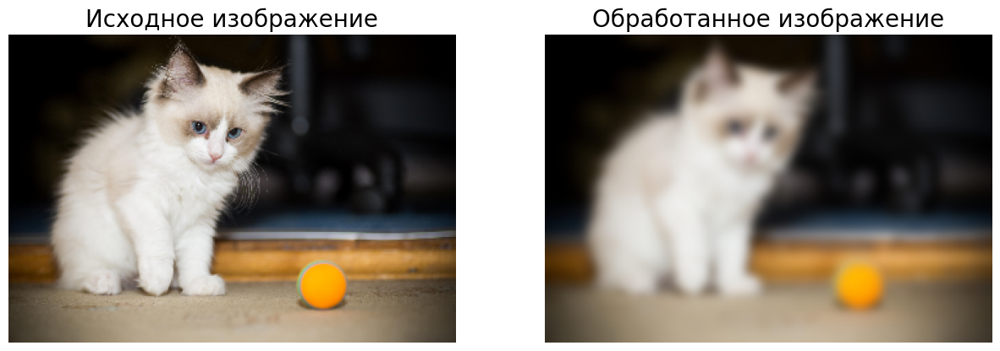

In [ ]:
blur_img = cv2.GaussianBlur(resized_img, (21, 21), 0) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(blur_img)

plt.show()

### Детектор границ Кенни (Canny)

В зависимости от предобработки фотографий получается разный результат при одних и тех же настройках детектора

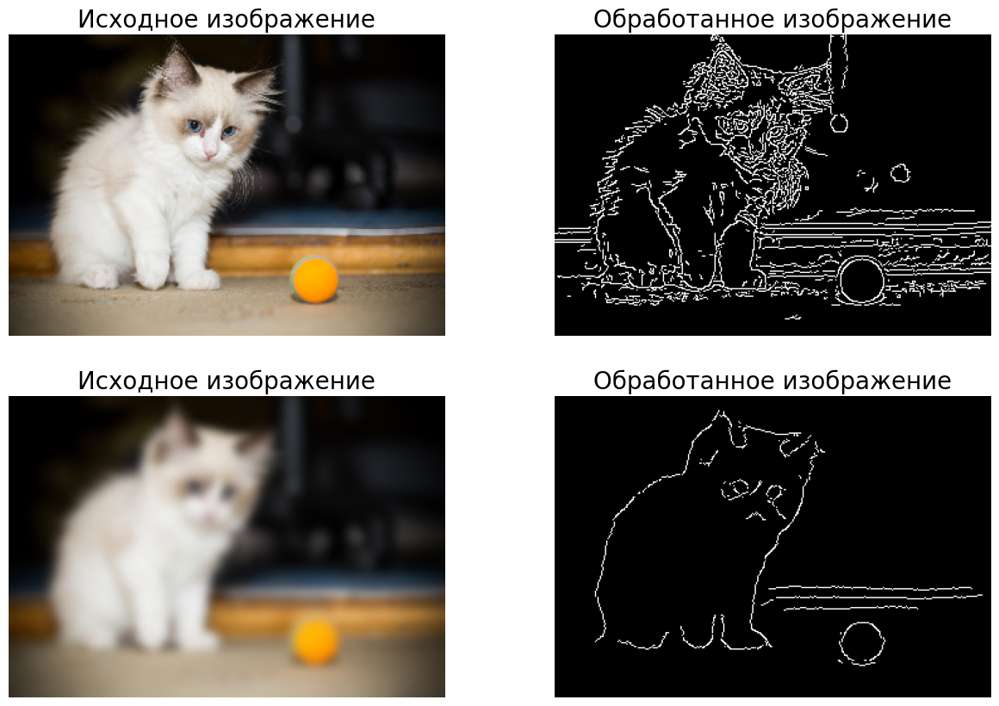

In [ ]:
edges1_img = cv2.Canny(resized_img, threshold1 = 50, threshold2 = 80)  # Основная команда
edges2_img = cv2.Canny(blur_img,    threshold1 = 50, threshold2 = 80)  # Основная команда

font_size = 20
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(2, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(edges1_img, cmap = 'gray')
plt.subplot(2, 2, 3).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(blur_img)
plt.subplot(2, 2, 4).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(edges2_img, cmap = 'gray')

plt.show()

### Базовое преобразование Хафа для поиска прямых и окружностей

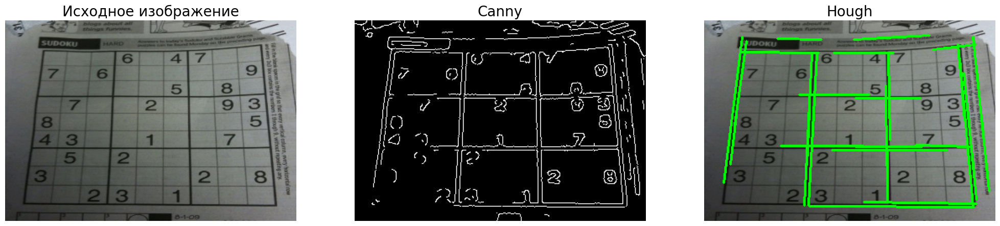

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('http://accord-framework.net/docs/images/imaging/hough-input.png')

height = 240
width = 347
resized_img = cv2.resize(img, (width, height))
img_copy = resized_img.copy()

blur_img = cv2.GaussianBlur(resized_img, (11, 11), 0)

edges_img = cv2.Canny(blur_img, 50, 60)

lines = cv2.HoughLinesP(edges_img, rho = 1, theta = 1 * np.pi / 180, threshold = 30, minLineLength = 50, maxLineGap = 10)

for line in lines:
    for x1, y1, x2, y2 in line:
        hough_lines_img = cv2.line(img_copy ,(x1,y1),(x2,y2),color = (0,255,0), thickness = 2)

font_size = 20
plt.figure(figsize=(25, 8))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 3, 2).set_title('Canny', fontsize = font_size); plt.axis('off')
plt.imshow(edges_img, cmap = 'gray')
plt.subplot(1, 3, 3).set_title('Hough', fontsize = font_size); plt.axis('off')
plt.imshow(hough_lines_img)
plt.show()

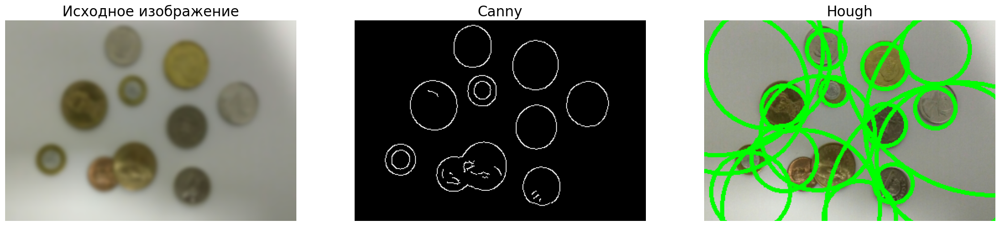

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('https://raw.githubusercontent.com/manasiye/Detect-Coins-using-Hough_Transform/master/HoughCircles.jpg')

height = 240
width = 347
resized_img = cv2.resize(img, (width, height))
img_copy = resized_img.copy()

blur_img = cv2.GaussianBlur(resized_img, (13,13), 0)

edges_img = cv2.Canny(blur_img, 50, 60)

circles = cv2.HoughCircles(edges_img, cv2.HOUGH_GRADIENT, 10, 50)

for circle in circles:
    for (x, y, r) in circle:
        hough_img = cv2.circle(img_copy, (int(x), int(y)), int(r), (0, 255, 0), 4)

font_size = 20
plt.figure(figsize=(25, 8))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(blur_img)
plt.subplot(1, 3, 2).set_title('Canny', fontsize = font_size); plt.axis('off')
plt.imshow(edges_img, cmap = 'gray')
plt.subplot(1, 3, 3).set_title('Hough', fontsize = font_size); plt.axis('off')
plt.imshow(hough_img)
plt.show()

### Проективные преобразования

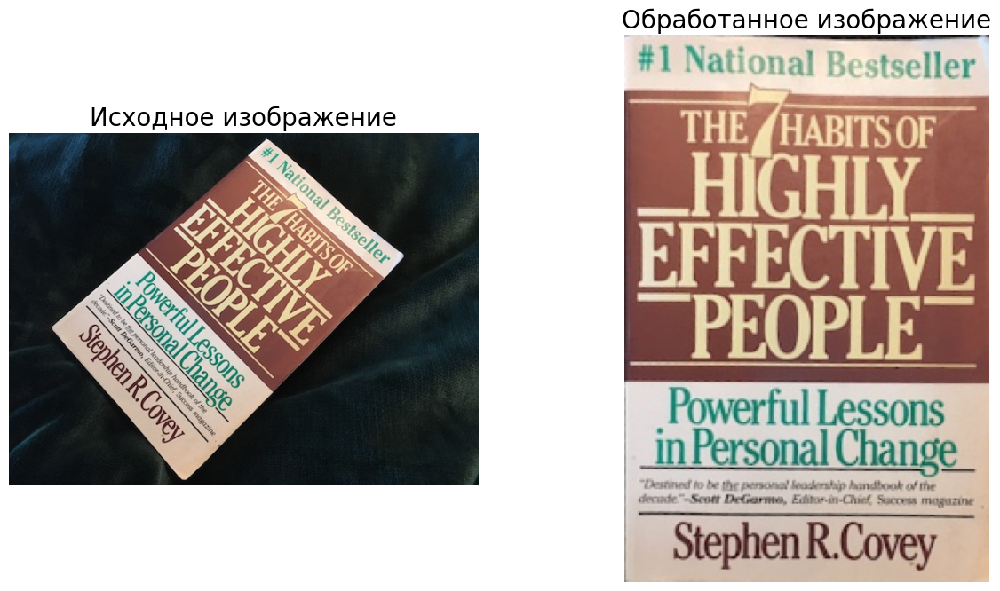

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('https://images.squarespace-cdn.com/content/v1/52d707a1e4b0cca896983732/1496409522326-F92L9BJ6UJFJ7FA608F6/image-asset.jpeg')

pts1 = np.float32([[330, 9],[505, 157],[224, 443],[54, 249]])
pts2 = np.float32([[0,0],[200,0],[200,300],[0,300]])

transformation_matrix = cv2.getPerspectiveTransform(pts1, pts2)
final_img = cv2.warpPerspective(img, M = transformation_matrix, dsize = (200, 300))
final_img = cv2.resize(final_img, (200, 300))

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)
plt.subplot(1,2,2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(final_img)
plt.show()

### Нахождение контуров

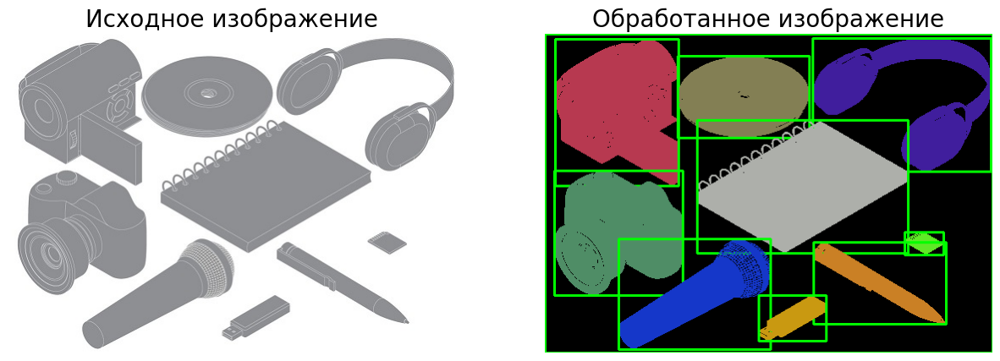

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('https://i.stack.imgur.com/4WFaG.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# binarize the image
ret, bw = cv2.threshold(gray, 128, 255,
cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

# find connected components
connectivity = 10
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(bw, connectivity, cv2.CV_32S)
sizes = stats[1:, -1]; nb_components = nb_components - 1
min_size = 12050 #threshhold value for objects in scene
img2 = np.zeros((img.shape), np.uint8)
for i in range(0, nb_components+1):
    # use if sizes[i] >= min_size: to identify your objects
    color = np.random.randint(255,size=3)
    # draw the bounding rectangele around each object
    cv2.rectangle(img2, (stats[i][0],stats[i][1]),(stats[i][0]+stats[i][2],stats[i][1]+stats[i][3]), (0,255,0), 2)
    img2[output == i + 1] = color

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)
plt.subplot(1,2,2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img2)
plt.show()

#### Нахождение наибольшего / наименьшего контура

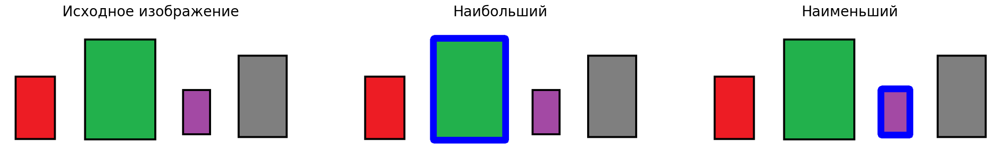

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np

img = imread('http://www.learningaboutelectronics.com/images/Containers.png')
img_copy1 = img.copy()
img_copy2 = img.copy()

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_edges = cv2.Canny(img_gray, 50, 200)
contours, hierarchy = cv2.findContours(img_edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

def get_contour_areas(contours):
    all_areas= []
    for cnt in contours:
        area= cv2.contourArea(cnt)
        all_areas.append(area)
    return all_areas

sorted_contours = sorted(contours, key=cv2.contourArea, reverse= True)
largest_item = sorted_contours[0]
cv2.drawContours(img_copy1, largest_item, -1, (0,0,255), 15)
smallest_item = sorted_contours[-1]
cv2.drawContours(img_copy2, smallest_item, -1, (0,0,255), 15)

font_size = 20
plt.figure(figsize=(25, 8))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)
plt.subplot(1, 3, 2).set_title('Наибольший', fontsize = font_size); plt.axis('off')
plt.imshow(img_copy1, cmap = 'gray')
plt.subplot(1, 3, 3).set_title('Наименьший', fontsize = font_size); plt.axis('off')
plt.imshow(img_copy2)
plt.show()

### Нахождение объектов

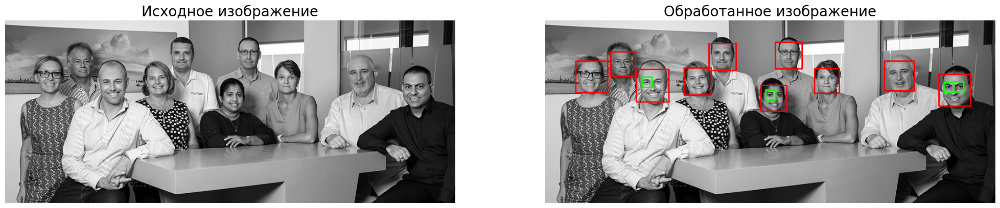

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt

img = imread('https://images.squarespace-cdn.com/content/v1/5be44996b98a783889d68ce7/1544065704472-U0MK6PRJVS8ERJBMZ7NL/Corporate+group+shot+Darwin.jpg')
img_copy = img.copy()
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')


faces = face_cascade.detectMultiScale(img_gray, scaleFactor = 1.3, minNeighbors = 5)
for (fx, fy, fw, fh) in faces:
    img = cv2.rectangle(img, (fx, fy), (fx + fw, fy + fh), (255, 0, 0), 2)

    roi_gray = img_gray[fy:fy+fh, fx:fx+fw]
    roi_color = img[fy:fy+fh, fx:fx+fw]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)

plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = 20); plt.axis('off')
plt.imshow(img_copy)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = 20); plt.axis('off')
plt.imshow(img)
plt.show()

## ResNet50
https://pytorch.org/hub/nvidia_deeplearningexamples_resnet50/

In [ ]:
!pip install validators

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 1.6 MB/s eta 0:00:00


In [ ]:
import torch
from PIL import Image
import torchvision.transforms as transforms
import numpy as np
import json
import requests
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Using {device} for inference')

Using cpu for inference


In [ ]:
resnet50 = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_resnet50', pretrained=True)
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_convnets_processing_utils')

resnet50.eval().to(device)

Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
Using cache found in /root/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layers): Sequential(
    (0): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d

In [ ]:
uris = [
    'http://images.cocodataset.org/test-stuff2017/000000024309.jpg',
    'http://images.cocodataset.org/test-stuff2017/000000028117.jpg',
    'http://images.cocodataset.org/test-stuff2017/000000006149.jpg',
    'http://images.cocodataset.org/test-stuff2017/000000004954.jpg',
]

batch = torch.cat(
    [utils.prepare_input_from_uri(uri) for uri in uris]
).to(device)

In [ ]:
with torch.no_grad():
    output = torch.nn.functional.softmax(resnet50(batch), dim=1)

results = utils.pick_n_best(predictions=output, n=5)

sample 0: [('laptop, laptop computer', '34.7%'), ('mouse, computer mouse', '11.9%'), ('notebook, notebook computer', '10.9%'), ('monitor', '3.9%'), ('web site, website, internet site, site', '3.1%')]
sample 1: [('mashed potato', '78.6%'), ('broccoli', '7.3%'), ('meat loaf, meatloaf', '2.5%'), ('plate', '1.8%'), ('guacamole', '0.2%')]
sample 2: [('racket, racquet', '25.4%'), ('tennis ball', '6.0%'), ('ping-pong ball', '2.0%'), ('catamaran', '0.3%'), ('bathtub, bathing tub, bath, tub', '0.3%')]
sample 3: [('groenendael', '12.7%'), ('Scottish deerhound, deerhound', '11.2%'), ('flat-coated retriever', '6.6%'), ('kelpie', '6.1%'), ('Great Dane', '3.1%')]


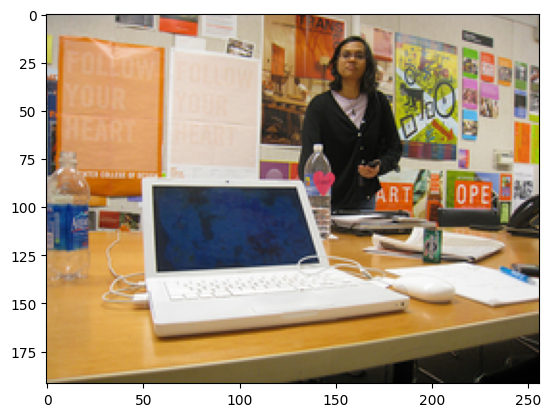

[('laptop, laptop computer', '34.7%'), ('mouse, computer mouse', '11.9%'), ('notebook, notebook computer', '10.9%'), ('monitor', '3.9%'), ('web site, website, internet site, site', '3.1%')]


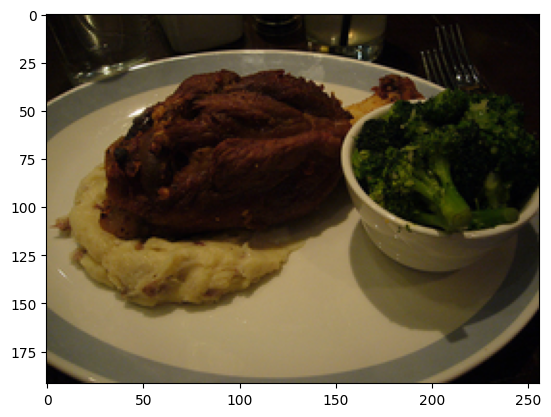

[('mashed potato', '78.6%'), ('broccoli', '7.3%'), ('meat loaf, meatloaf', '2.5%'), ('plate', '1.8%'), ('guacamole', '0.2%')]


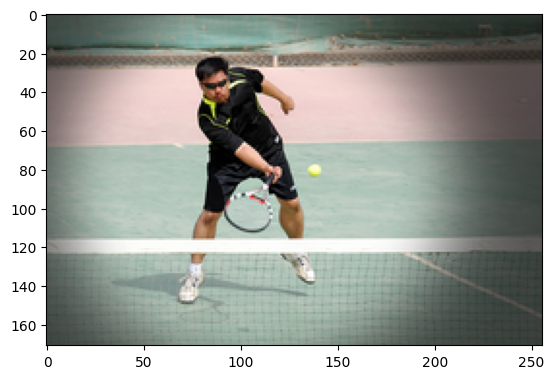

[('racket, racquet', '25.4%'), ('tennis ball', '6.0%'), ('ping-pong ball', '2.0%'), ('catamaran', '0.3%'), ('bathtub, bathing tub, bath, tub', '0.3%')]


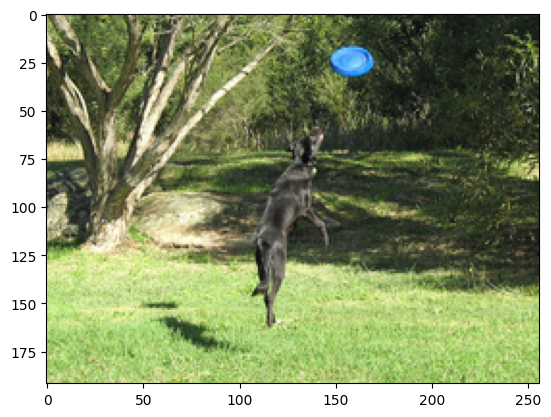

[('groenendael', '12.7%'), ('Scottish deerhound, deerhound', '11.2%'), ('flat-coated retriever', '6.6%'), ('kelpie', '6.1%'), ('Great Dane', '3.1%')]


In [ ]:
for uri, result in zip(uris, results):
    img = Image.open(requests.get(uri, stream=True).raw)
    img.thumbnail((256,256), Image.LANCZOS)
    plt.imshow(img)
    plt.show()
    print(result)

## Скачивание видео с Youtube

In [ ]:
!pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz  --quiet

     / 2.7 MB 9.6 MB/s 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
!yt-dlp -F "https://www.youtube.com/watch?v=b8QZJ5ZodTs"

[youtube] Extracting URL: https://www.youtube.com/watch?v=b8QZJ5ZodTs
[youtube] b8QZJ5ZodTs: Downloading webpage
[youtube] b8QZJ5ZodTs: Downloading ios player API JSON
[youtube] b8QZJ5ZodTs: Downloading mweb player API JSON
[youtube] b8QZJ5ZodTs: Downloading player 3ede36f2
[youtube] b8QZJ5ZodTs: Downloading m3u8 information
[info] Available formats for b8QZJ5ZodTs:
ID  EXT   RESOLUTION FPS CH │   FILESIZE   TBR PROTO │ VCODEC          VBR ACODEC      ABR ASR MORE INFO
────────────────────────────────────────────────────────────────────────────────────────────────────────────────
sb0 mhtml 48x27        7    │                  mhtml │ images                                  storyboard
233 mp4   audio only        │                  m3u8  │ audio only          unknown             Default
234 mp4   audio only        │                  m3u8  │ audio only          unknown             Default
140 m4a   audio only      2 │  219.89KiB  130k https │ audio only          mp4a.40.2  130k 44k medium

In [ ]:
from __future__ import unicode_literals
#Imports the module
import yt_dlp as youtube_dl
#You would put the advanced settings in between the brackets
ydl_opts = {
    "format": "mp4[height=360]", # This will select the specific resolution typed here
    }
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
  #Swap in your YouTube videos here
  ydl.download(['https://www.youtube.com/watch?v=b8QZJ5ZodTs',])

[youtube] Extracting URL: https://www.youtube.com/watch?v=b8QZJ5ZodTs
[youtube] b8QZJ5ZodTs: Downloading webpage
[youtube] b8QZJ5ZodTs: Downloading ios player API JSON
[youtube] b8QZJ5ZodTs: Downloading mweb player API JSON
[youtube] b8QZJ5ZodTs: Downloading m3u8 information
[info] b8QZJ5ZodTs: Downloading 1 format(s): 18
[download] Destination: Crowd walking on street [b8QZJ5ZodTs].mp4
[download] 100% of    1.26MiB in 00:00:00 at 1.42MiB/s   


## Обработка видео с помощью OpenCV

In [ ]:
import cv2
from datetime import datetime
date_time = datetime.now()

capture = cv2.VideoCapture('Crowd walking on street [b8QZJ5ZodTs].mp4')
width  = int(capture.get(cv2.CAP_PROP_FRAME_WIDTH))   # float `width`
height = int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
codec = cv2.VideoWriter_fourcc(*'MP4V')
output = cv2.VideoWriter('output1.mp4', codec, 30.0, (width,  height))

while True:
    rtrn, image = capture.read()
    if not rtrn:
        break

    now = datetime.now()
    date_time = now.strftime("%d/%m/%Y, %H:%M:%S")
    cv2.putText(image, date_time, (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1., (0,255,255), 2)
    output.write(image)

capture.release()
output.release()

In [ ]:
import cv2

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

capture = cv2.VideoCapture('Crowd walking on street [b8QZJ5ZodTs].mp4')
width  = int(capture.get(cv2.CAP_PROP_FRAME_WIDTH))   # float `width`
height = int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
codec = cv2.VideoWriter_fourcc(*'MP4V')
output = cv2.VideoWriter('output2.mp4', codec, 30.0, (width,  height))

while True:
    rtrn, image = capture.read()
    if not rtrn:
        break

    faces = face_cascade.detectMultiScale(image, scaleFactor = 1.3, minNeighbors = 5)
    for (fx, fy, fw, fh) in faces:
        cv2.rectangle(image, (fx, fy), (fx + fw, fy + fh), (0, 0, 255), 2)

    output.write(image)

capture.release()
output.release()

## Dlib

In [ ]:
!pip install face_recognition

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566162 sha256=4f28578e5e9831c39f7415fabbf64b8da5c5366fb90440dd9fe83be5a67863da
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models


In [ ]:
import face_recognition
import cv2

capture = cv2.VideoCapture('Crowd walking on street [b8QZJ5ZodTs].mp4')
width  = int(capture.get(cv2.CAP_PROP_FRAME_WIDTH))   # float `width`
height = int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
codec = cv2.VideoWriter_fourcc(*'MP4V')
output = cv2.VideoWriter('output3.mp4', codec, 30.0, (width,  height))

while True:
    rtrn, image = capture.read()
    if not rtrn:
        break

    face_locations = face_recognition.face_locations(image)
    face_encodings = face_recognition.face_encodings(image, face_locations)

    for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
        name = "Unknown"
        cv2.rectangle(image, (left, top), (right, bottom), (0, 0, 255), 2)
        cv2.rectangle(image, (left, bottom - 25), (right, bottom), (0, 0, 255), cv2.FILLED)
        font = cv2.FONT_HERSHEY_COMPLEX_SMALL
        cv2.putText(image, name, (left + 6, bottom - 6), font, 0.7, (255, 255, 255), 1)

    output.write(image)

capture.release()
output.release()

## YOLO

Среда выполнения -> Сменить среду выполнени -> T4 GPU -> Сохранить

In [ ]:
!pip install ultralytics >> None

In [ ]:
!wget https://raw.githubusercontent.com/freedomwebtech/peoplecounteryolov8/main/coco.txt

my_file = open("coco.txt", "r")
data = my_file.read()
class_list = data.split("\n")
print(class_list)

--2025-01-10 06:40:18--  https://raw.githubusercontent.com/freedomwebtech/peoplecounteryolov8/main/coco.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 699 [text/plain]
Saving to: ‘coco.txt’

coco.txt            100%[===================>]     699  --.-KB/s    in 0s      

2025-01-10 06:40:18 (36.9 MB/s) - ‘coco.txt’ saved [699/699]

['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis rack

In [ ]:
import cv2
import pandas as pd
import numpy as np
from ultralytics import YOLO

model=YOLO('yolov8s.pt')

capture = cv2.VideoCapture('Crowd walking on street [b8QZJ5ZodTs].mp4')
width  = int(capture.get(cv2.CAP_PROP_FRAME_WIDTH))   # float `width`
height = int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
codec = cv2.VideoWriter_fourcc(*'MP4V')
output = cv2.VideoWriter('output4.mp4', codec, 30.0, (width,  height))

while True:
    rtrn, image = capture.read()
    if not rtrn:
        break

    results = model.predict(image)
    results = results[0].boxes.data
    results = results.cpu().numpy()

    for row in results:
        x1=int(row[0])
        y1=int(row[1])
        x2=int(row[2])
        y2=int(row[3])
        d=int(row[5])
        c=class_list[d]
        if 'person' in c:
            cv2.rectangle(image,(x1,y1),(x2,y2),(0,255,0),2)
            cv2.putText(image,str(c),(x1,y1),cv2.FONT_HERSHEY_COMPLEX,(0.5),(255,255,255),1)

    output.write(image)

capture.release()
output.release()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 194MB/s]



0: 384x640 17 persons, 1 car, 3 traffic lights, 2 backpacks, 3 handbags, 42.4ms
Speed: 5.8ms preprocess, 42.4ms inference, 905.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 1 car, 3 traffic lights, 2 handbags, 10.9ms
Speed: 3.2ms preprocess, 10.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 1 car, 3 traffic lights, 2 backpacks, 2 handbags, 11.4ms
Speed: 3.0ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 16 persons, 1 car, 3 traffic lights, 2 handbags, 10.8ms
Speed: 2.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 18 persons, 1 car, 3 traffic lights, 2 backpacks, 3 handbags, 10.9ms
Speed: 2.8ms preprocess, 10.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 17 persons, 3 traffic lights, 2 backpacks, 2 handbags, 10.9ms
Speed: 1.4ms preprocess, 10.9ms inference, 1.3ms postprocess

# Домашние задания

## №1
Распознать изображение с игральными картами и вывести изображение и номинал каждой карты

http://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png

1. Прочитайте изображение из файла и выведите его на экран:

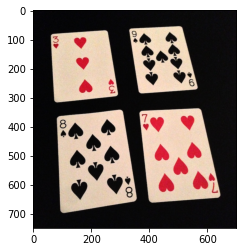

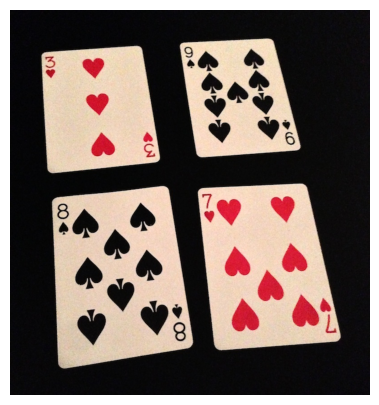

In [ ]:
import cv2
import matplotlib.pyplot as plt
from skimage.io import imread
import numpy as np

img = imread('http://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png')

plt.figure(figsize=(10,5))
plt.imshow(img)
plt.axis('off')
plt.show()

2. Выполните последоватьельно 2 преобразования: переведите изображение в оттенки серого (COLOR_BGR2GRAY) и примените размытие (GaussianBlur):

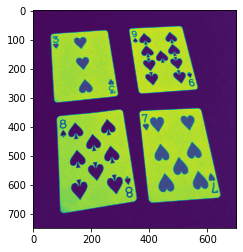

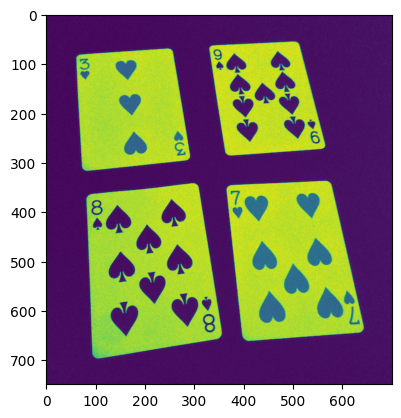

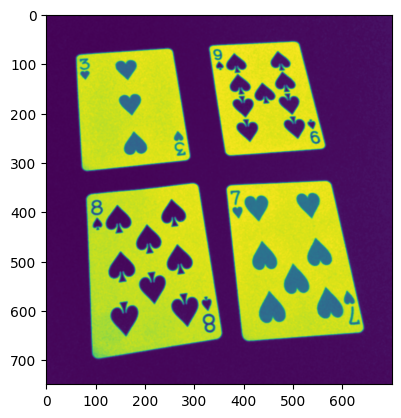

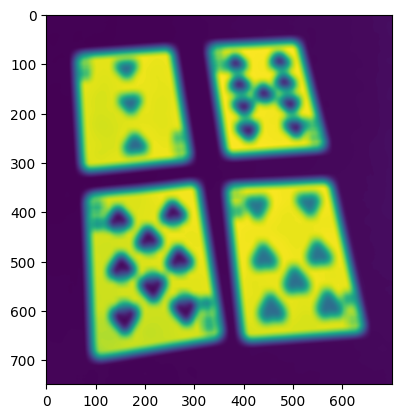

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray)
plt.show()
#легкое размытие
blur = cv2.GaussianBlur(gray, (11, 11), 1)
plt.imshow(blur)
plt.show()
#сильное размытие
strong_blur = cv2.GaussianBlur(gray, (31, 31), 10)
plt.imshow(strong_blur)
plt.show()

3. Найдите 4 контура максимального размера и выведите их на исходном изображении:

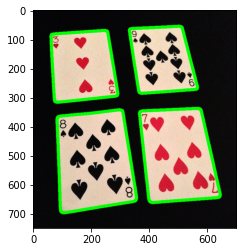

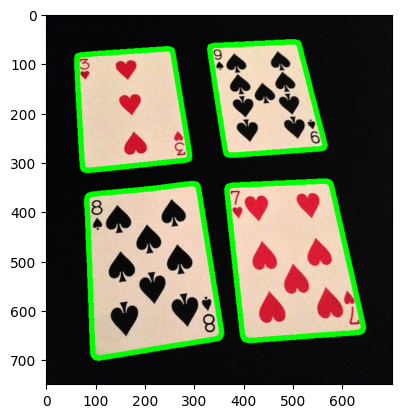

In [ ]:
numcards = 4

#изображение преобразуется в черно-белое
flag, thresh = cv2.threshold(blur, 128, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse= True)[:numcards]

contours_img = img.copy()
cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 10)
plt.imshow(contours_img)
plt.show()

4. Примените к каждому контуру проективное преобразование и выведите отдельным изображением:

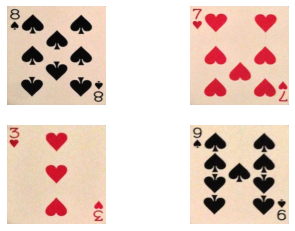

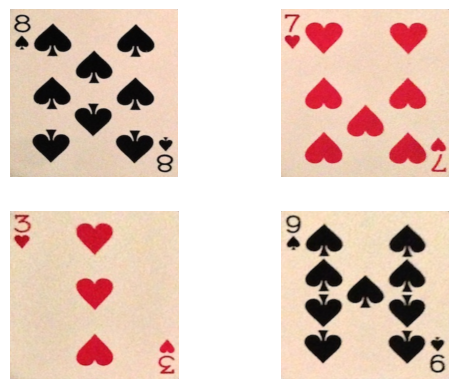

In [ ]:
for i in range(numcards):
  card = contours[i]
  peri = cv2.arcLength(card,True)
  approx = np.array(cv2.approxPolyDP(card,0.02*peri,True), np.float32)
  h = np.array([[0,0],[450,0],[450,450],[0,450]], np.float32)
  transform = cv2.getPerspectiveTransform(approx,h)
  warp = cv2.warpPerspective(img,transform,(450,450))[:,::-1]
  plt.subplot(2,2,i+1); plt.axis('off')
  plt.imshow(warp)

plt.show()

5. Найдите количество символов на одной карте:
- на изображение карты найдите все контуры;
- найдите максимальный контур (не совпадающий с самой картой);
- найдите другие контуры, отличающиеся от максимального по размеру не более 10%;
- посчитайте количество максимальных контуров.

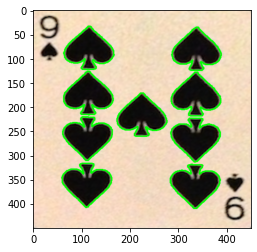

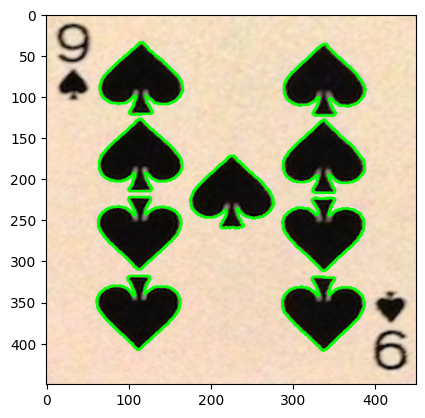

9


In [ ]:
img_gray = cv2.cvtColor(warp,cv2.COLOR_RGB2GRAY)
contours_img = warp.copy()

flag, thresh = cv2.threshold(img_gray, 150, 150, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)

main_contours = []
main_area = 0
for contour in contours:
  if cv2.contourArea(contour) > 0.9 * warp.shape[0] * warp.shape[1]: continue
  if main_area == 0:
    main_contours.append(contour)
    main_area = cv2.contourArea(contour)
  else:
    if cv2.contourArea(contour) > main_area * 0.9:
      main_contours.append(contour)


cv2.drawContours(contours_img, main_contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 2)
plt.imshow(contours_img)

plt.show()

print(len(main_contours))

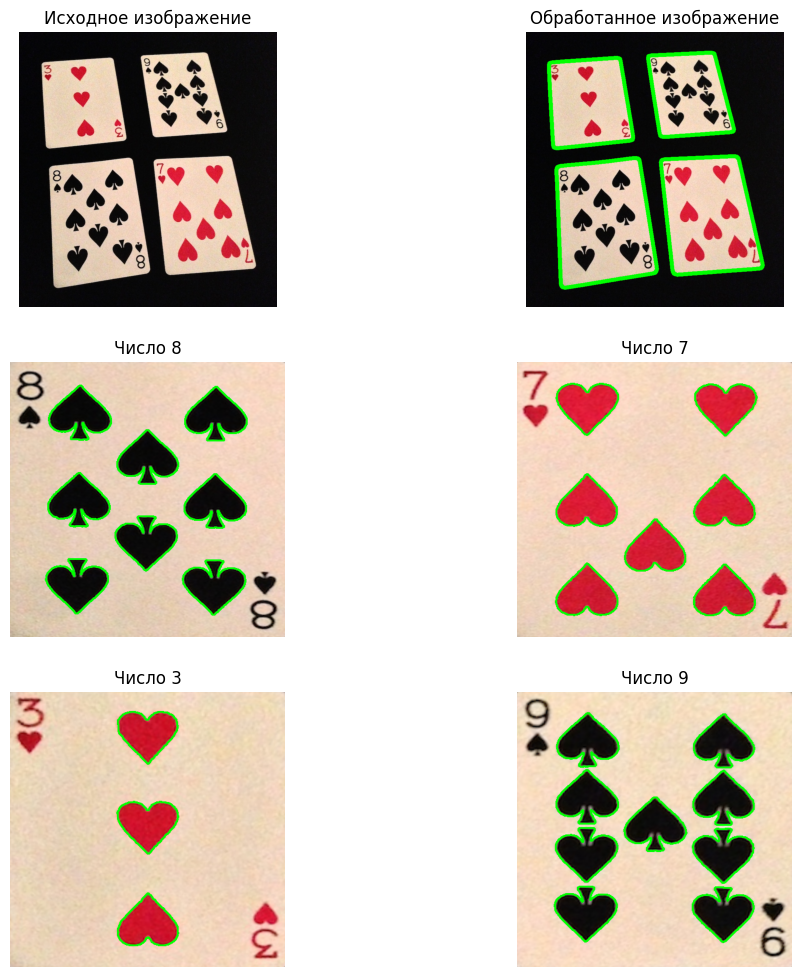

In [ ]:
import cv2
import matplotlib.pyplot as plt
from skimage.io import imread
import numpy as np

img = imread('http://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png')

plt.figure(figsize=(12, 25))
plt.subplot(6, 2, 1)
plt.title("Исходное изображение", fontsize=12)
plt.imshow(img)
plt.axis('off')

numcards = 4

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
blur = cv2.GaussianBlur(gray, (11, 11), 1)
flag, thresh = cv2.threshold(blur, 128, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse= True)[:numcards]

contours_img = img.copy()
cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 10)

plt.subplot(6, 2, 2)
plt.title("Обработанное изображение", fontsize=12)
plt.imshow(contours_img)
plt.axis('off')

def draw_contours(warp):
  img_gray = cv2.cvtColor(warp,cv2.COLOR_RGB2GRAY)
  contours_img = warp.copy()
  flag, thresh = cv2.threshold(img_gray, 150, 150, cv2.THRESH_BINARY)
  contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
  contours = sorted(contours, key=cv2.contourArea, reverse=True)

  main_contours = []
  main_area = 0
  for contour in contours:
    if cv2.contourArea(contour) > 0.9 *warp.shape[0]*warp.shape[1]: continue
    if main_area == 0:
          main_contours.append(contour)
          main_area = cv2.contourArea(contour)
    else:
      if cv2.contourArea(contour) > main_area * 0.9:
        main_contours.append(contour)

  cv2.drawContours(contours_img, main_contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 2)
  return contours_img, len(main_contours)

for i in range(numcards):
  card = contours[i]
  peri = cv2.arcLength(card,True)
  approx = np.array(cv2.approxPolyDP(card,0.02*peri,True), np.float32)
  h = np.array([[0,0],[450,0],[450,450],[0,450]], np.float32)
  transform = cv2.getPerspectiveTransform(approx,h)
  warp = cv2.warpPerspective(img,transform,(450,450))[:,::-1]
  contours_img, main_contours = draw_contours(warp)
  plt.subplot(6, 2, i + 3)
  plt.title(f"Число {main_contours}", fontsize=12)
  plt.axis('off')
  plt.imshow(contours_img)

plt.show()

6. Соберите все предыдущие команды в один код, чтобы на выходе получилось следующее изображение:

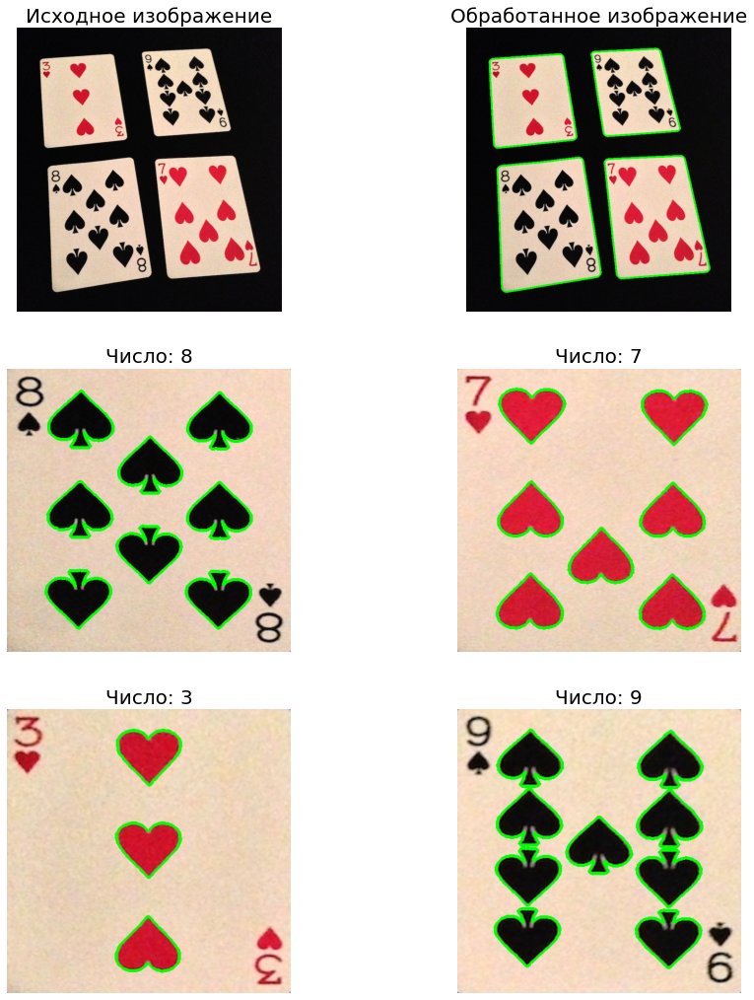

## №2
Подумайте, что нужно изменить, чтобы код сработал для этого изображения:

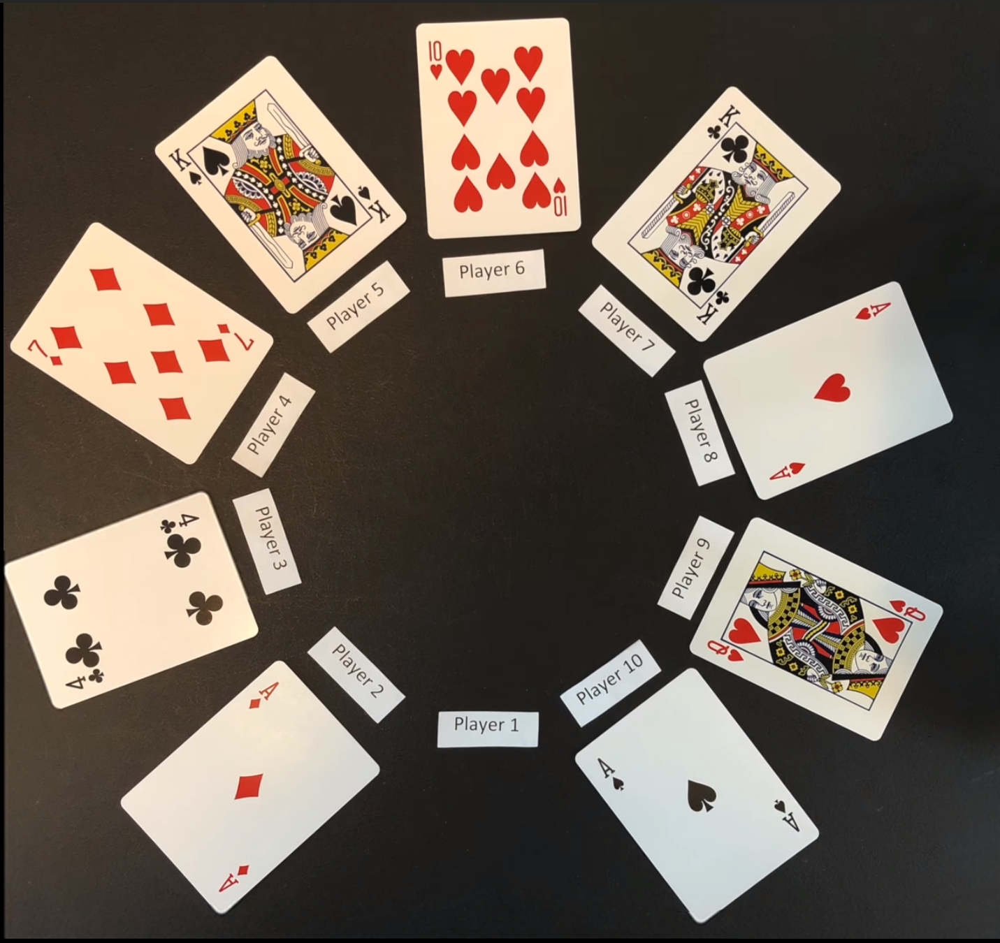

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


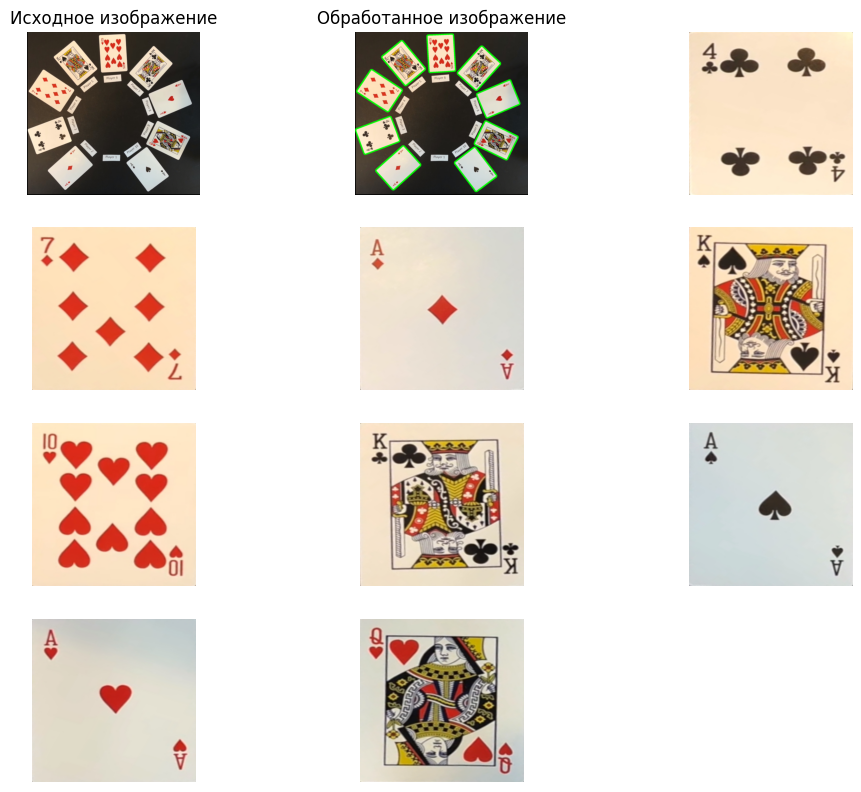

In [ ]:
import cv2
import matplotlib.pyplot as plt
from skimage.io import imread
import numpy as np
import math

def calculate_distance(p1, p2):
    return math.sqrt((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2)

def get_angle_of_rotation(corners):
    top_left = corners[0]
    top_right = corners[1]
    bottom_right = corners[2]
    bottom_left = corners[3]
    width = calculate_distance(top_left, top_right)
    height = calculate_distance(top_left, bottom_left)
    if width > height:
      return 90
    return 0

def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated_image


img = imread('/content/drive/MyDrive/crads_round.png')

plt.figure(figsize=(12, 25))
plt.subplot(10, 3, 1)
plt.title("Исходное изображение", fontsize=12)
plt.imshow(img)
plt.axis('off')

numcards = 9

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
blur = cv2.GaussianBlur(gray, (25, 11), 1)

flag, thresh = cv2.threshold(blur, 100, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse= True)[:numcards]

contours_img = img.copy()
cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 10)

plt.subplot(10, 3, 2)
plt.title("Обработанное изображение", fontsize=12)
plt.imshow(contours_img)
plt.axis('off')

def draw_contours(warp):
  img_gray = cv2.cvtColor(warp,cv2.COLOR_RGB2GRAY)
  contours_img = warp.copy()
  flag, thresh = cv2.threshold(img_gray, 150, 255, cv2.THRESH_BINARY)
  contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
  contours = sorted(contours, key=cv2.contourArea, reverse=True)

  main_contours = []
  main_area = 0
  for contour in contours:
    if cv2.contourArea(contour) > 0.9*warp.shape[0]*warp.shape[1]: continue
    if main_area == 0:
          main_contours.append(contour)
          main_area = cv2.contourArea(contour)
    else:
      if cv2.contourArea(contour) > main_area * 0.9:
        main_contours.append(contour)

  card_type = 'simple'
  if len(main_contours) == 1:
    area = cv2.contourArea(main_contours[0]);
    if area > 0.5*warp.shape[0]*warp.shape[1]:
        card_type = 'special'
    else:
        card_type = 'ace'

  cv2.drawContours(contours_img, main_contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 2)
  return contours_img, len(main_contours), card_type


for i in range(numcards):
    card = contours[i]
    peri = cv2.arcLength(card,True)
    approx = np.array(cv2.approxPolyDP(card, 0.02*peri,True), np.float32)
    corners = approx.reshape(-1, 2)
    angle = get_angle_of_rotation(corners)
    h = np.array([[0,0],[450,0],[450,450],[0,450]], np.float32)
    transform = cv2.getPerspectiveTransform(approx,h)
    warp = cv2.warpPerspective(img,transform,(450,450))[:,::-1]
    warp_rotated = rotate_image(warp, angle)
    ##contours_img, contours_count, card_type = draw_contours(warp_rotated)
    plt.subplot(10, 3, i + 3)
   # plt.title(f"Число: {contours_count}, {card_type}", fontsize=12)
    plt.axis('off')
    plt.imshow(warp_rotated)

plt.show()

22353312 11260063
20120792 16460647
10214554 22176691


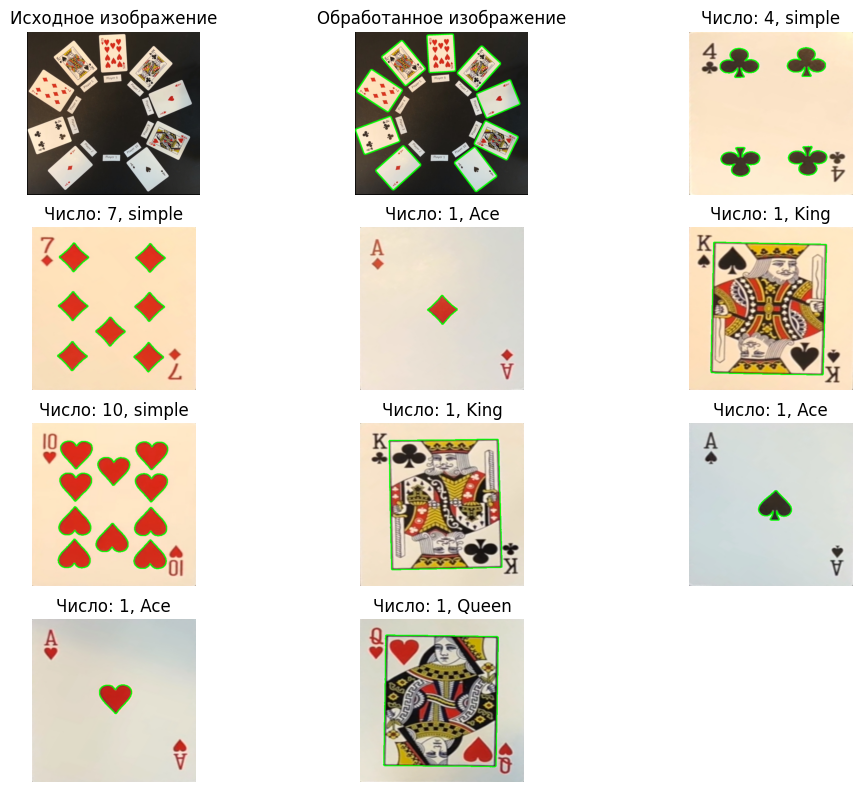

In [ ]:
import cv2
import matplotlib.pyplot as plt
from skimage.io import imread
import numpy as np
import math

template_Q = imread("/content/drive/MyDrive/queen.png")
template_K = imread("/content/drive/MyDrive/king.png")
template_Q = cv2.cvtColor(template_Q, cv2.COLOR_RGB2GRAY)
template_K = cv2.cvtColor(template_K, cv2.COLOR_RGB2GRAY)
template_Q = cv2.resize(template_Q, (450, 450))
template_K = cv2.resize(template_K, (450, 450))

def compare_with_cards(img):
    score_Q = np.sum((img - template_Q) ** 2)
    score_K = np.sum((img - template_K) ** 2)
    if score_Q < score_K:
        return "Queen"
    else:
        return "King"


def calculate_distance(p1, p2):
    return math.sqrt((p2[0] - p1[0]) ** 2 + (p2[1] - p1[1]) ** 2)

def get_angle_of_rotation(corners):
    top_left = corners[0]
    top_right = corners[1]
    bottom_right = corners[2]
    bottom_left = corners[3]
    width = calculate_distance(top_left, top_right)
    height = calculate_distance(top_left, bottom_left)
    if width > height:
      return 90
    return 0

def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated_image = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated_image


img = imread('/content/drive/MyDrive/crads_round.png')

plt.figure(figsize=(12, 25))
plt.subplot(10, 3, 1)
plt.title("Исходное изображение", fontsize=12)
plt.imshow(img)
plt.axis('off')

numcards = 9

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
blur = cv2.GaussianBlur(gray, (25, 11), 1)

flag, thresh = cv2.threshold(blur, 100, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse= True)[:numcards]

contours_img = img.copy()
cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 10)

plt.subplot(10, 3, 2)
plt.title("Обработанное изображение", fontsize=12)
plt.imshow(contours_img)
plt.axis('off')

def draw_contours(warp):
  img_gray = cv2.cvtColor(warp,cv2.COLOR_RGB2GRAY)
  contours_img = warp.copy()
  flag, thresh = cv2.threshold(img_gray, 150, 255, cv2.THRESH_BINARY)
  contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
  contours = sorted(contours, key=cv2.contourArea, reverse=True)
  main_contours = []
  main_area = 0
  for contour in contours:
    if cv2.contourArea(contour) > 0.9*warp.shape[0]*warp.shape[1]: continue
    if main_area == 0:
          main_contours.append(contour)
          main_area = cv2.contourArea(contour)
    else:
      if cv2.contourArea(contour) > main_area * 0.9:
        main_contours.append(contour)

  card_type = 'simple'
  if len(main_contours) == 1:
    area = cv2.contourArea(main_contours[0]);
    if area > 0.5*warp.shape[0]*warp.shape[1]:
        card_type = compare_with_cards(img_gray)
    else:
        card_type = 'Ace'

  cv2.drawContours(contours_img, main_contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 2)
  return contours_img, len(main_contours), card_type


for i in range(numcards):
    card = contours[i]
    peri = cv2.arcLength(card,True)
    approx = np.array(cv2.approxPolyDP(card, 0.02*peri,True), np.float32)
    corners = approx.reshape(-1, 2)
    angle = get_angle_of_rotation(corners)
    h = np.array([[0,0],[450,0],[450,450],[0,450]], np.float32)
    transform = cv2.getPerspectiveTransform(approx,h)
    warp = cv2.warpPerspective(img,transform,(450,450))[:,::-1]
    warp_rotated = rotate_image(warp, angle)
    contours_img, contours_count, card_type = draw_contours(warp_rotated)
    plt.subplot(10, 3, i + 3)
    plt.title(f"Число: {contours_count}, {card_type}", fontsize=12)
    plt.axis('off')
    plt.imshow(contours_img)

plt.show()